__A video generator for the txt file generated in C++__   
Run this file after running the C++ and getting the txt file.

In [1]:
# required imports here

import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import glob
import re

In [2]:
#import txt file here

xyz_coordinate_for_plot = []

with open ("saved_xyz_coordinates.txt", "r") as file:
    for line in file:
        x,y,z = line.split()
        xyz_coordinate_for_plot.append([float(x), float(y), float(z)])
    
xyz_coordinate_for_plot = np.array(xyz_coordinate_for_plot)

#check if it works :)
#print(xyz_coordinate_for_plot.shape)
#print(xyz_coordinate_for_plot[0])

Values for my point : 10.8348 0.925 16.4088
Values for my point : 11.0483 1.7243 17.1175
Values for my point : 10.2503 2.04974 16.5501
Values for my point : 10.2987 1.12591 16.8748
Values for my point : 9.73825 0.989372 16.121
Values for my point : 9.28461 0.154318 16.1481
Values for my point : 8.97126 1.12701 14.8318
Values for my point : 8.41733 0.626246 16.2
Values for my point : 7.94131 -0.127482 13.9558
Values for my point : 6.96178 0.404607 14.183
Values for my point : 7.07017 0.210846 13.5877
Values for my point : 6.30518 -0.455265 14.0161
Values for my point : 5.82716 0.0476354 11.9102
Values for my point : 6.00643 -0.114564 11.7663
Values for my point : 5.67408 0.137729 12.6565
Values for my point : 4.75547 -0.12157 11.0524
Values for my point : 4.2279 -0.993033 10.1307
Values for my point : 3.47064 -1.05646 9.76746
Values for my point : 3.10573 -0.495042 8.99938
Values for my point : 2.15547 0.0896722 5.95836


/var/folders/30/m1kbwrfj1vq208k3z5ptb2th0000gn/T/ipykernel_83132/2391239156.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig=plt.figure()


Values for my point : 2.03151 0.433346 6.7752
Values for my point : 1.20111 -0.479478 5.35276
Values for my point : 0.208212 -1.18964 4.48834
Values for my point : -0.239977 -0.7923 3.75111
Values for my point : 0.160472 -0.291562 2.49031
Values for my point : 0.388341 0.0400389 2.6848
Values for my point : 1.129 0.12052 3.65538
Values for my point : 1.09753 0.158337 3.64462
Values for my point : 0.409017 0.081147 2.84757
Values for my point : 0.119194 -0.190091 1.60966
Values for my point : 0.723627 -0.133599 3.40905
Values for my point : -0.19797 0.169291 1.94475
Values for my point : 0.326713 0.237563 3.00412
Values for my point : 0.149785 0.122137 1.33374
Values for my point : -0.169745 0.0654184 1.21263
Values for my point : 0.510158 0.144298 3.33669
Values for my point : -0.142991 -0.757901 3.38535
Values for my point : 0.788309 -0.0436783 3.00823
Values for my point : 0.393503 0.0695118 2.75439
Values for my point : 0.22869 -0.161861 2.10468
Values for my point : -0.124247 -0.32

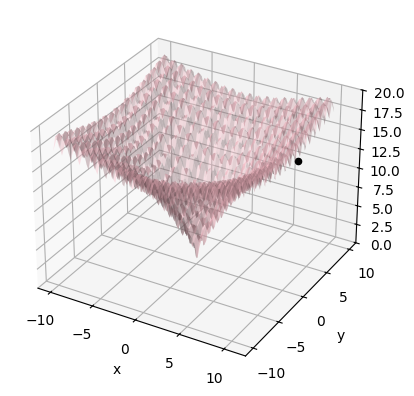

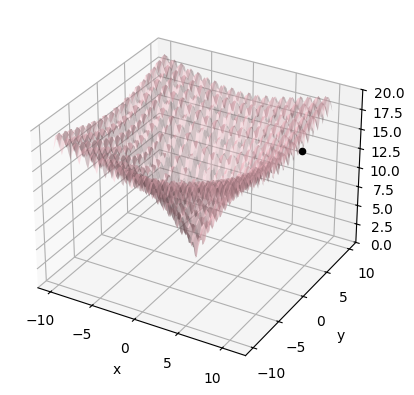

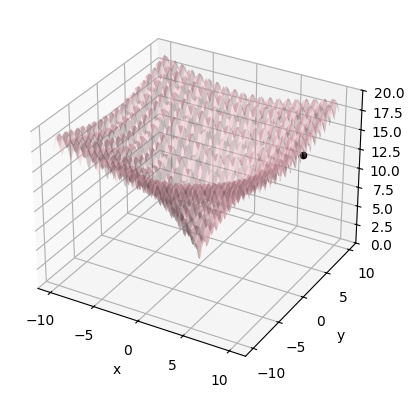

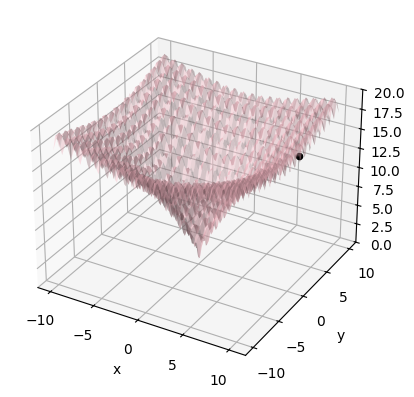

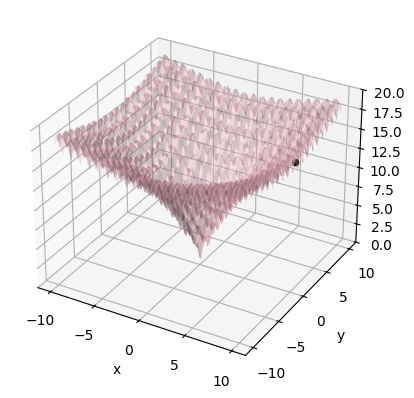

...

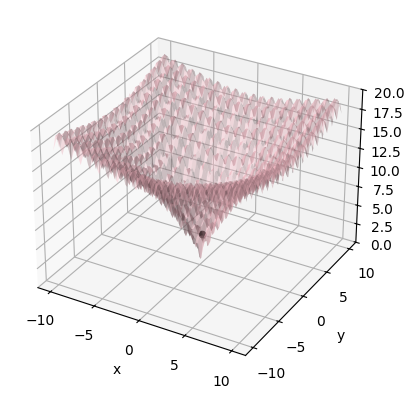

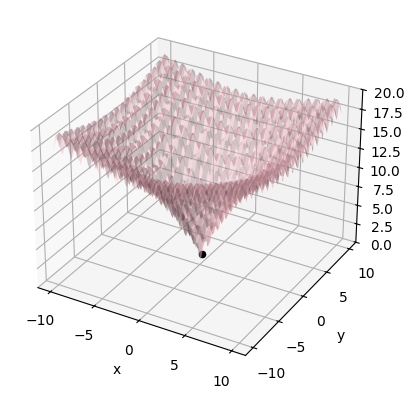

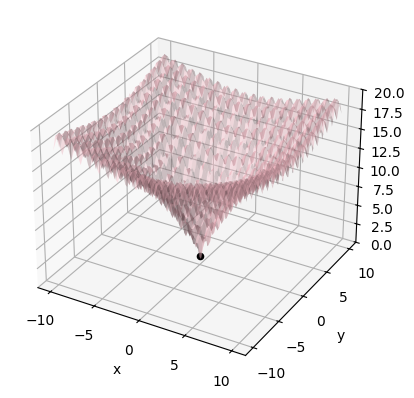

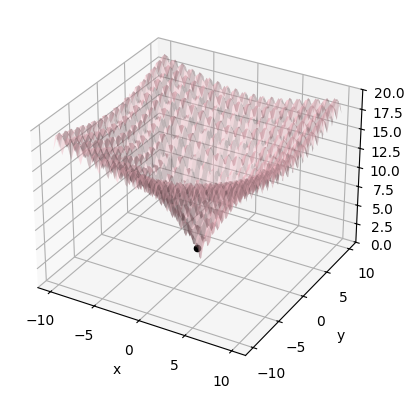

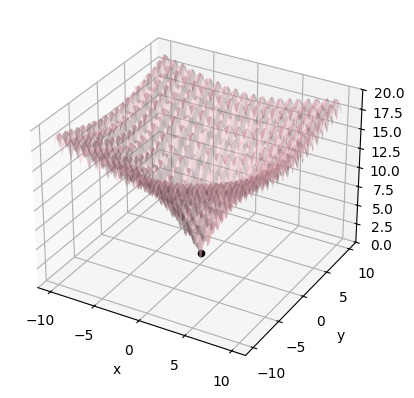

In [3]:
#read coordinates and plot, then save images

x_linspace_for_making_mesh= np.linspace(-10,10,100)
y_linspace_for_making_mesh= np.linspace(-10,10,100)
x_to_be_plotted_mesh_grid_dots,y_to_be_plotted_mesh_grid_dots= np.meshgrid(x_linspace_for_making_mesh,y_linspace_for_making_mesh)
part_a_ackley= -0.2*(((x_to_be_plotted_mesh_grid_dots**2+\
                       y_to_be_plotted_mesh_grid_dots**2)/2)**0.5)
part_b_ackley= (np.cos(2*np.pi*x_to_be_plotted_mesh_grid_dots)+np.cos(2*np.pi*y_to_be_plotted_mesh_grid_dots))/2
z_ackley_value_output_to_be_plotted= -20*np.exp(part_a_ackley)-np.exp(part_b_ackley)+20+np.e


for iteration in range(xyz_coordinate_for_plot.shape[0]):
    x_coordinate, y_coordinate, z_coordinate = xyz_coordinate_for_plot[iteration]
    
    fig=plt.figure()
    ax=fig.add_subplot(111,projection='3d')
    ax.plot_surface(x_to_be_plotted_mesh_grid_dots,y_to_be_plotted_mesh_grid_dots,z_ackley_value_output_to_be_plotted, color= 'pink', alpha=0.4)
    ax.set_zlim(0, 20)
    ax.scatter(x_coordinate,y_coordinate,z_coordinate, color='black', alpha=1)
    plt.xlabel('x')
    plt.ylabel('y')
    print(f"Values for my point : {x_coordinate} {y_coordinate} {z_coordinate}")
    plt.savefig(f"/Users/veronicajung/codefolder/ackleyfunctioncpp/graphimages/frame_{iteration}.png")
print("done")


In [4]:
# usage of cv2 to make a video

image_filepath_strings= sorted(glob.glob("graphimages/*.png"))
image_filepath_strings.sort(key=lambda x: int(re.findall(r'\d+', x)[0]))

print(image_filepath_strings)
frame= cv2.imread("/Users/veronicajung/codefolder/ackleyfunctioncpp/graphimages/frame_0.png", cv2.IMREAD_COLOR)
height, width, layers= frame.shape
output_video_name= "optimal mimimum point.mp4"
frame_size= (width, height)
fps= 10
fourcc= cv2.VideoWriter.fourcc(*"mp4v")
video= cv2.VideoWriter(output_video_name, fourcc, fps, frame_size)

for image_filepath_string in image_filepath_strings:
    frame= cv2.imread(image_filepath_string, cv2.IMREAD_COLOR)
    video.write(frame) 
video.release()

['graphimages/frame_0.png', 'graphimages/frame_1.png', 'graphimages/frame_2.png', 'graphimages/frame_3.png', 'graphimages/frame_4.png', 'graphimages/frame_5.png', 'graphimages/frame_6.png', 'graphimages/frame_7.png', 'graphimages/frame_8.png', 'graphimages/frame_9.png', 'graphimages/frame_10.png', 'graphimages/frame_11.png', 'graphimages/frame_12.png', 'graphimages/frame_13.png', 'graphimages/frame_14.png', 'graphimages/frame_15.png', 'graphimages/frame_16.png', 'graphimages/frame_17.png', 'graphimages/frame_18.png', 'graphimages/frame_19.png', 'graphimages/frame_20.png', 'graphimages/frame_21.png', 'graphimages/frame_22.png', 'graphimages/frame_23.png', 'graphimages/frame_24.png', 'graphimages/frame_25.png', 'graphimages/frame_26.png', 'graphimages/frame_27.png', 'graphimages/frame_28.png', 'graphimages/frame_29.png', 'graphimages/frame_30.png', 'graphimages/frame_31.png', 'graphimages/frame_32.png', 'graphimages/frame_33.png', 'graphimages/frame_34.png', 'graphimages/frame_35.png', '